## Actividad 1: Análisis exploratorio de la calidad de los datos

Objetivo: El objetivo de este cuaderno es identificar los problemas de cantidad presentes en el conjunto de datos para luego poder corregirlos.

Como primer paso se va a actualizar la librería Pandas a su última versión, pues algunos de los códigos que se van a utilizar en el cuaderno requieren la útlima versión. Para actualizar se utiliza el comando **pip install**. Luego se importa el paquete y se comprueba la versión que ha quedado instalada:

In [ ]:
# Instalar la versión específica 1.3.0 de la biblioteca pandas
!pip install pandas==1.3.0


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 7.4 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × pip subprocess to install build dependencies did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Installing build dependencies ... error
error: subprocess-exited-with-error

× pip subprocess to install build dependencies did not run successfully.
│ exit code: 1
╰─> See above for output.

note: This error originates from a subprocess, and is likely not a problem with pip.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:

# Importar la biblioteca pandas con el alias pd
import pandas as pd

# Verificar y mostrar la versión de pandas que está siendo utilizada
pd.__version__


'1.5.3'

### Cargar los datos

Para los siguientes módulos se va trabajar con el conjunto de datos Automobile, en el siguiente enlace puede encontrar más información:


*   Descripción de los datos: https://archive.ics.uci.edu/ml/datasets/automobile
*   Para utilizar con Python: https://archive.ics.uci.edu/ml/machine-learning-databases/autos/imports-85.data
*   Tipo de datos: csv
*   Todos los datos han sido anonimizados para no descubrir la identidad de los clientes.
En el siguiente código se cargan los datos de la misma forma que en los notebooks anteriores:




In [ ]:
# Leer datos desde archivo CSV
path_csv = "https://archive.ics.uci.edu/ml/machine-learning-databases/autos/imports-85.data"
df= pd.read_csv(path_csv,sep=",",header=None)

# Crear la lista headers
headers = ["simbolizacion","perdidas-normalizadas","marca","tipo-combustible","aspiracion","num-puertas","carroceria-estilo","ruedas-motrices","motor-ubicacion","distancia-ejes","longitud","ancho","alto","peso-vacio","motor-tipo","num-cilindros","motor-tamaño","sistema-combustible","diametro","carrera","radio-compresion","caballos-fuerza","peak-rpm","ciudad-mpg","carretera-mpg","precio"]
df.columns = headers

# Imprimir las primeras cinco filas de un dataframe para probar que todo ok
df.head()

,simbolizacion,perdidas-normalizadas,marca,tipo-combustible,aspiracion,num-puertas,carroceria-estilo,ruedas-motrices,motor-ubicacion,distancia-ejes,...,motor-tamaño,sistema-combustible,diametro,carrera,radio-compresion,caballos-fuerza,peak-rpm,ciudad-mpg,carretera-mpg,precio
0,3,?,alfa-romero,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495
1,3,?,alfa-romero,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500
2,1,?,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,...,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500
3,2,164,audi,gas,std,four,sedan,fwd,front,99.8,...,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950
4,2,164,audi,gas,std,four,sedan,4wd,front,99.4,...,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450


### Tipos de datos

Los datos se encuentran en una variedad de tipos.
Los tipos principales almacenados en dataframes de Pandas son **object, float, int, bool y datetime64**. Para aprender mejor acerca de cada atributo es importante el tipo de dato de cada columna, con la función `dataframe.dtype` se puede lograr:

In [ ]:
# La función dtype genera una tabla con el tipo de dato de cada columna
df.dtypes

simbolizacion              int64
perdidas-normalizadas     object
marca                     object
tipo-combustible          object
aspiracion                object
num-puertas               object
carroceria-estilo         object
ruedas-motrices           object
motor-ubicacion           object
distancia-ejes           float64
longitud                 float64
ancho                    float64
alto                     float64
peso-vacio                 int64
motor-tipo                object
num-cilindros             object
motor-tamaño               int64
sistema-combustible       object
diametro                  object
carrera                   object
radio-compresion         float64
caballos-fuerza           object
peak-rpm                  object
ciudad-mpg                 int64
carretera-mpg              int64
precio                    object
dtype: object

Se observa que el tipo de datos de **simbolizacion** y **peso-vacio** es `int64`, **perdida-normalizada** es `object` que **diametro**, etc. Estos tipos de datos pueden modificarse. Para cambiar el tipo de dato de una columna específica se utiliza la función `pandas.to_numeric`

In [ ]:
# Utilizamos errors='coerce' para ignorar los datos faltantes que por el momento no se ha resuelto
df["precio"] = pd.to_numeric(df["precio"],errors='coerce')
df.dtypes

simbolizacion              int64
perdidas-normalizadas     object
marca                     object
tipo-combustible          object
aspiracion                object
num-puertas               object
carroceria-estilo         object
ruedas-motrices           object
motor-ubicacion           object
distancia-ejes           float64
longitud                 float64
ancho                    float64
alto                     float64
peso-vacio                 int64
motor-tipo                object
num-cilindros             object
motor-tamaño               int64
sistema-combustible       object
diametro                  object
carrera                   object
radio-compresion         float64
caballos-fuerza           object
peak-rpm                  object
ciudad-mpg                 int64
carretera-mpg              int64
precio                   float64
dtype: object

AHORA TÚ

Cambie el tipo de datos de la columna "carrera", "perdida-normalizada", "diametro", "cabellos-fuerza" y "peak-rpm". ¡No olvide cambiarlos, será necesario más adelante!

In [ ]:
#Solucion
df["carrera"] = pd.to_numeric(df["carrera"],errors='coerce')
df["perdidas-normalizadas"] = pd.to_numeric(df["perdidas-normalizadas"],errors='coerce')
df["diametro"] = pd.to_numeric(df["diametro"],errors='coerce')
df["caballos-fuerza"] = pd.to_numeric(df["caballos-fuerza"],errors='coerce')
df["peak-rpm"] = pd.to_numeric(df["peak-rpm"],errors='coerce')

In [ ]:
df.dtypes

simbolizacion              int64
perdidas-normalizadas    float64
marca                     object
tipo-combustible          object
aspiracion                object
num-puertas               object
carroceria-estilo         object
ruedas-motrices           object
motor-ubicacion           object
distancia-ejes           float64
longitud                 float64
ancho                    float64
alto                     float64
peso-vacio                 int64
motor-tipo                object
num-cilindros             object
motor-tamaño               int64
sistema-combustible       object
diametro                 float64
carrera                  float64
radio-compresion         float64
caballos-fuerza          float64
peak-rpm                 float64
ciudad-mpg                 int64
carretera-mpg              int64
precio                   float64
dtype: object

## Actividad 2: Análisis de tendencia central, posición y dispersión

Análisis de tendencia central utilizando el histograma. Se observa, moda, mediana, media, sesgo y kurtosis.
En la siguiente linea importe las librerías para visualización:

In [ ]:
# Importando las bibliotecas necesarias para visualización de datos y análisis exploratorio
import matplotlib.pyplot as plt  # Biblioteca para crear gráficos y visualizaciones estáticas, animadas e interactivas en Python
import seaborn as sns  # Biblioteca para crear gráficos estadísticos atractivos y informativos en Python


Se puede identificar la simetría de los datos utilizando gráficos de histograma:
Se puede identificar que el atributo **engine-size** correspondiente con el tamaño del motor, es asimétrico, y además presenta un sesgo positivo hacia la derecha:

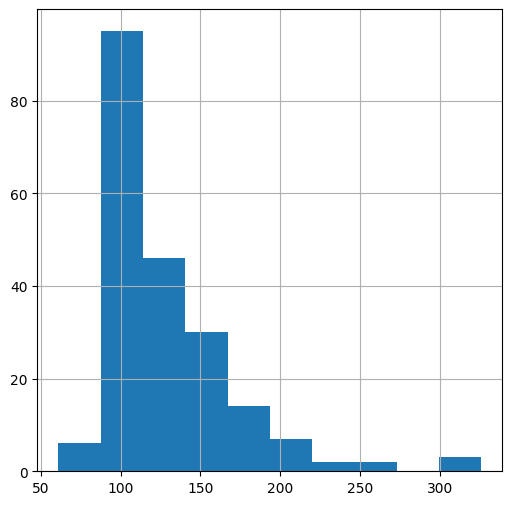

In [ ]:
# Creando un histograma para la columna 'engine-size' del DataFrame df
# figsize=(6,6) especifica las dimensiones del gráfico en pulgadas
df['motor-tamaño'].hist(figsize=(6,6))

# Mostrando el gráfico en pantalla
plt.show()


Tambien se pueden utilizar los gráficos de distplot y displot:

<ipython-input-11-e112cff4da01>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['motor-tamaño'])


<Axes: xlabel='motor-tamaño', ylabel='Density'>

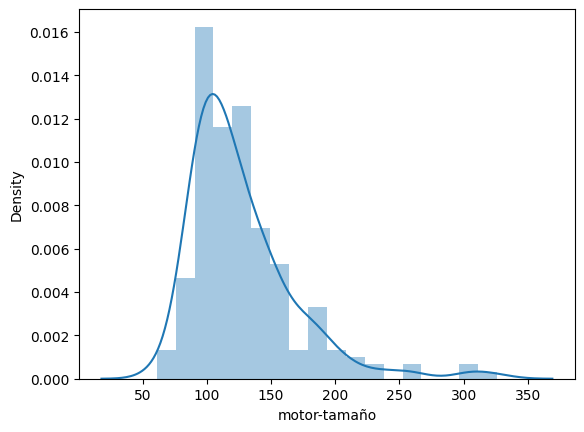

In [ ]:
# Utilizando Seaborn para crear un diagrama de distribución (histograma y KDE) para la columna 'engine-size' del DataFrame df
sns.distplot(df['motor-tamaño'])

Los valores numéricos se pueden calcular directamente para su análisis

In [ ]:
# Calculando estadísticas descriptivas para la columna 'motor-tamaño' del DataFrame df
mean = df['motor-tamaño'].mean()  # Calcula la media (promedio) de 'motor-tamaño'
median = df['motor-tamaño'].median()  # Calcula la mediana de 'motor-tamaño'
mode = df['motor-tamaño'].mode()  # Calcula la moda de 'motor-tamaño'
skew = df['motor-tamaño'].skew()  # Calcula la asimetría (skewness) de 'motor-tamaño'
kurt = df['motor-tamaño'].kurt()  # Calcula la curtosis (kurtosis) de 'motor-tamaño'

print("La media es :",mean)
print("La mediana es :",median)
print("La moda es :",mode)
print("El sesgo es :",skew)
print("La kurtosis es :",kurt)

La media es : 126.90731707317073
La mediana es : 120.0
La moda es : 0     92
1    122
Name: motor-tamaño, dtype: int64
El sesgo es : 1.9476550452788108
La kurtosis es : 5.305682091703767


Se puede apreciar como la media y la mediana est'an cerca pero son diferentes. Hay 4 valores para la moda. El sesgo es mayor que 1, lo que indica el sesgo positivo y la kurtosis es positiva, lo que significa que más datos alrededor de la media, lo cual se evidencia en el gráfico.


**AHORA TÚ**

Analiza la tendencia central del atributo **longitud**, que representa la longitud del auto. ¿Qué se puede interpretar del gráfico y las medidas?

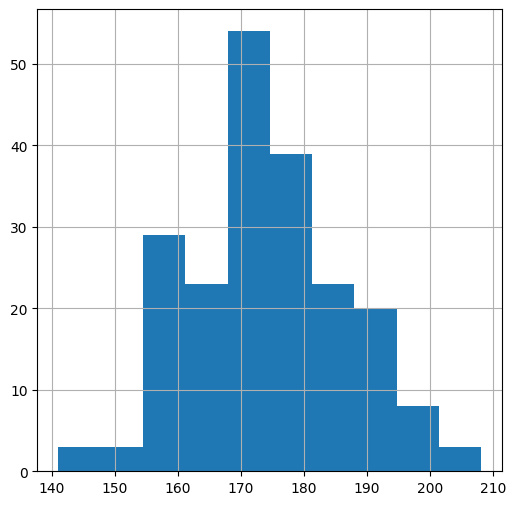

<ipython-input-13-1492e3eb4a09>:7: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['longitud'])


La media es : 174.04926829268288
La mediana es : 173.2
La moda es : 157.3
El sesgo es : 0.1559537713215604
La kurtosis es : -0.08289485344758996


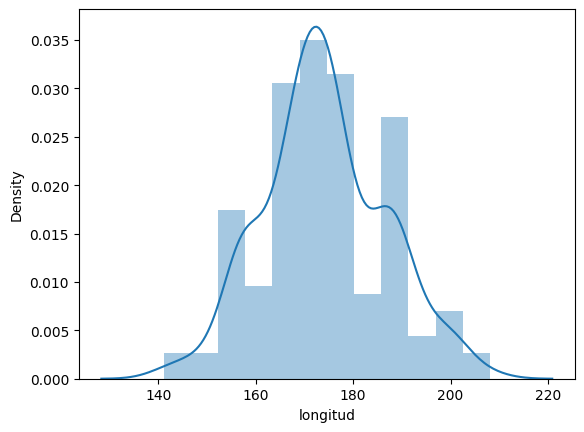

In [ ]:
#Solucion
#Usando matplotlib
df['longitud'].hist(figsize=(6,6))
plt.show()
#Usamos seaborn
# Creando un diagrama de distribución para la columna 'longitud' del DataFrame df
sns.distplot(df['longitud'])

# Calculando estadísticas descriptivas para la columna 'longitud' del DataFrame df
mean_longitud = df['longitud'].mean()
median_longitud = df['longitud'].median()
mode_longitud = df['longitud'].mode()
skew_longitud = df['longitud'].skew()
kurt_longitud = df['longitud'].kurt()

# Imprimiendo las estadísticas descriptivas
print("La media es :", mean_longitud)
print("La mediana es :", median_longitud)
print("La moda es :", mode_longitud[0])  # Moda retorna una serie, seleccionamos el primer elemento
print("El sesgo es :", skew_longitud)
print("La kurtosis es :", kurt_longitud)


Para visualizar las medidas de posición y analizar la dispersión de los datos se utilizan los gráficos de tipo boxplot. Aquí es importante identificar los valores de máximo mínimo, mediana y cuartiles:

In [ ]:
df.dtypes

simbolizacion              int64
perdidas-normalizadas    float64
marca                     object
tipo-combustible          object
aspiracion                object
num-puertas               object
carroceria-estilo         object
ruedas-motrices           object
motor-ubicacion           object
distancia-ejes           float64
longitud                 float64
ancho                    float64
alto                     float64
peso-vacio                 int64
motor-tipo                object
num-cilindros             object
motor-tamaño               int64
sistema-combustible       object
diametro                 float64
carrera                  float64
radio-compresion         float64
caballos-fuerza          float64
peak-rpm                 float64
ciudad-mpg                 int64
carretera-mpg              int64
precio                   float64
dtype: object

In [ ]:
df["precio"] = pd.to_numeric(df["precio"],errors='coerce')

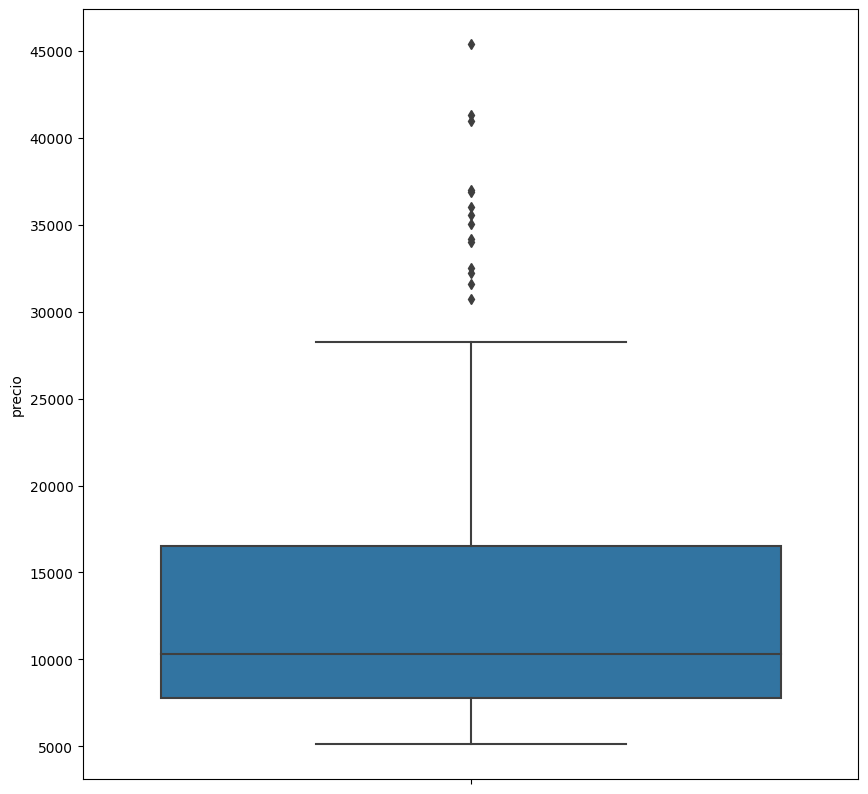

In [ ]:
# Creando una figura con dimensiones específicas (10x10 pulgadas)
fig=plt.figure(figsize=(10,10))
df.dtypes


# Creando un diagrama de caja (boxplot) para la columna 'price' del DataFrame df
# Esto ayuda a visualizar la distribución de los datos, identificar outliers, y observar la tendencia central y dispersión
sns.boxplot(y=df['precio'])

# Mostrando el gráfico en pantalla
plt.show()


In [ ]:
# Calculando y mostrando varias estadísticas descriptivas para la columna 'price' del DataFrame df
min=df['precio'].min()  # Valor mínimo
max=df['precio'].max()  # Valor máximo
median=df['precio'].median()  # Mediana
quantile=df['precio'].quantile()  # Cuartiles (por defecto, el cuantil 0.5 que es la mediana)

print("El minimo es :", min)
print("El máximo es :", max)
print("La mediana es :", median)
print("Los cuartiles son :", quantile)  # Nota: esto imprimirá la mediana ya que el cuartil 0.5 es la mediana


El minimo es : 5118.0
El máximo es : 45400.0
La mediana es : 10295.0
Los cuartiles son : 10295.0


Representar más de una variable en el gráfico de boxplot permite comparar la dispersión de los datos al poder ver los resultados de forma continua. Veamo la relación entre engine-location y price.

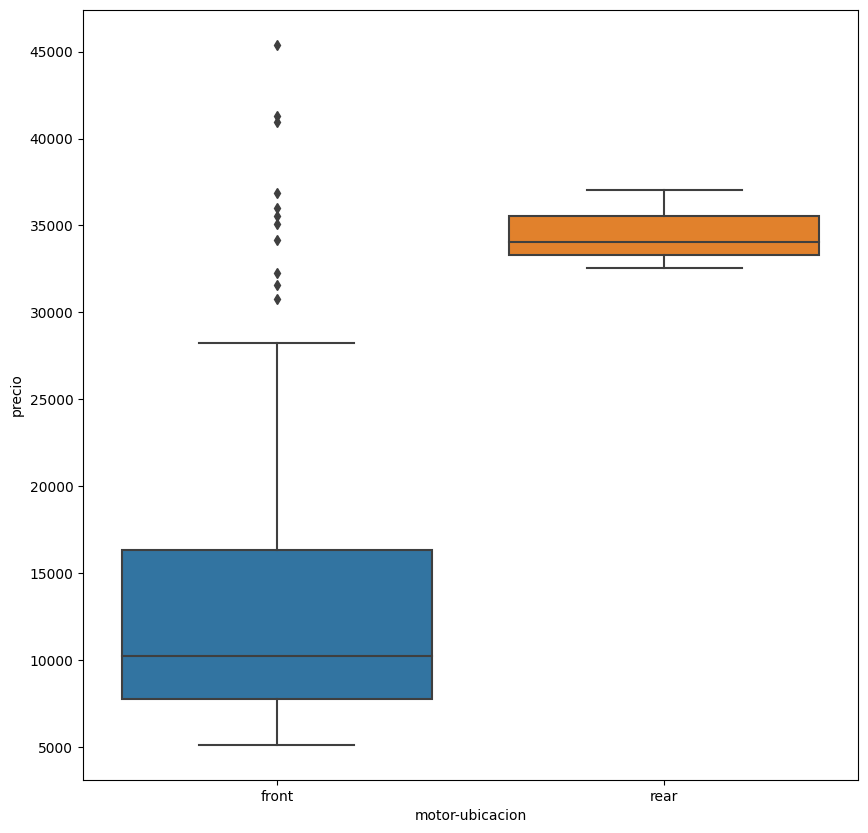

In [ ]:
# Creando una figura con dimensiones específicas (10x10 pulgadas)
fig=plt.figure(figsize=(10,10))

# Creando un diagrama de caja (boxplot) para comparar la distribución de los precios entre las diferentes ubicaciones del motor
# 'x' especifica la variable categórica (en este caso 'engine-location') y 'y' especifica la variable numérica (en este caso 'price')
# 'data' especifica el DataFrame de origen de los datos
sns.boxplot(x="motor-ubicacion", y="precio", data=df)

# Mostrando el gráfico en pantalla
plt.show()


Aquí se ve la distribución del precio entre estas dos categorías de ubicación del motor, delantera y trasera, es lo suficientemente distinta como para tomar la ubicación del motor como un buen predictor potencial del precio.

**AHORA TÚ**

Analiza los gráficos de boxplot utilizando los atributos body-style y price ¿Qué se puede interpretar del gráfico? ¿Sería bueno utilizar esta variable para predecir el precio del auto?

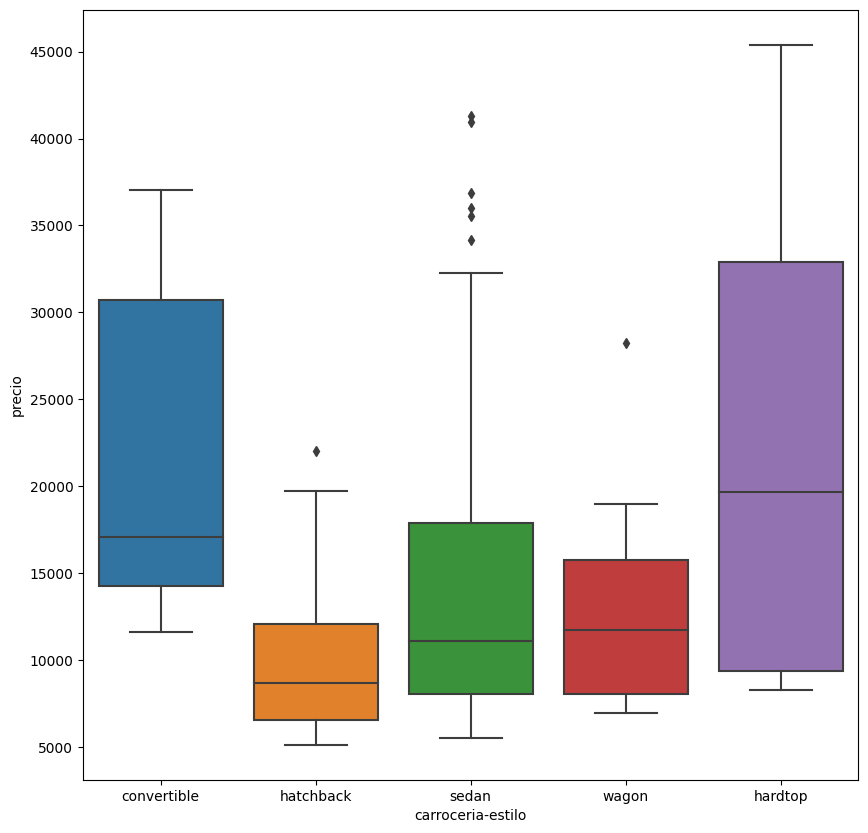

In [ ]:
# Solucionario

# Creando una figura con dimensiones específicas (10x10 pulgadas)
fig=plt.figure(figsize=(10,10))

# Creando un diagrama de caja (boxplot) para comparar la distribución de los precios entre los diferentes estilos de carrocería
sns.boxplot(x="carroceria-estilo", y="precio", data=df)

# Mostrando el gráfico en pantalla
plt.show()



In [ ]:
#  El gráfico de boxplot mostrará cómo los precios varían entre diferentes estilos de carrocería.
# Si hay una variación significativa en los precios entre diferentes estilos,
# entonces 'body-style' podría ser una variable útil para predecir el precio.
# Sin embargo, si las distribuciones se superponen mucho, la utilidad de 'body-style' como predictor podría ser limitada.
# También, la presencia de outliers puede afectar la precisión de la predicción.
# Es crucial considerar estas observaciones junto con otras variables y análisis para determinar la utilidad de 'body-style' en la predicción del precio.

### Identificar datos faltantes

Para identificar los datos faltantes en el conjunto de datos, lo primero es visualizar los datos e identificar el valor(es) que se está utilizando para los datos faltantes. Los valores faltantes pueden ser espacios vacíos. NA, n/a, --,?, 0, o cualquier otro valor que no es considerado correcto en esa columna.

In [ ]:
# Identifique cual es el valor que se está utilizando para los datos faltantes en el set de datos:
df.head(20)

,simbolizacion,perdidas-normalizadas,marca,tipo-combustible,aspiracion,num-puertas,carroceria-estilo,ruedas-motrices,motor-ubicacion,distancia-ejes,...,motor-tamaño,sistema-combustible,diametro,carrera,radio-compresion,caballos-fuerza,peak-rpm,ciudad-mpg,carretera-mpg,precio
0,3,NaN,alfa-romero,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111.0,5000.0,21,27,13495.0
1,3,NaN,alfa-romero,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111.0,5000.0,21,27,16500.0
2,1,NaN,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,...,152,mpfi,2.68,3.47,9.0,154.0,5000.0,19,26,16500.0
3,2,164.0,audi,gas,std,four,sedan,fwd,front,99.8,...,109,mpfi,3.19,3.40,10.0,102.0,5500.0,24,30,13950.0
4,2,164.0,audi,gas,std,four,sedan,4wd,front,99.4,...,136,mpfi,3.19,3.40,8.0,115.0,5500.0,18,22,17450.0
5,2,NaN,audi,gas,std,two,sedan,fwd,front,99.8,...,136,mpfi,3.19,3.40,8.5,110.0,5500.0,19,25,15250.0
6,1,158.0,audi,gas,std,four,sedan,fwd,front,105.8,...,136,mpfi,3.19,3.40,8.5,110.0,5500.0,19,25,17710.0
7,1,NaN,audi,gas,std,four,wagon,fwd,front,105.8,...,136,mpfi,3.19,3.40,8.5,110.0,5500.0,19,25,18920.0
8,1,158.0,audi,gas,turbo,four,sedan,fwd,front,105.8,...,131,mpfi,3.13,3.40,8.3,140.0,5500.0,17,20,23875.0
9,0,NaN,audi,gas,turbo,two,hatchback,4wd,front,99.5,...,131,mpfi,3.13,3.40,7.0,160.0,5500.0,16,22,NaN


Con la función datafram.isnull podemos saber cuántos datos faltantes identifica Python en el conjunto de datos:

In [ ]:
# Imprimiendo la cantidad de valores nulos en cada columna del DataFrame df
# La función isnull() identifica los valores nulos, y sum() suma la cantidad de valores nulos por columna
print(df.isnull().sum())

simbolizacion             0
perdidas-normalizadas    41
marca                     0
tipo-combustible          0
aspiracion                0
num-puertas               0
carroceria-estilo         0
ruedas-motrices           0
motor-ubicacion           0
distancia-ejes            0
longitud                  0
ancho                     0
alto                      0
peso-vacio                0
motor-tipo                0
num-cilindros             0
motor-tamaño              0
sistema-combustible       0
diametro                  4
carrera                   4
radio-compresion          0
caballos-fuerza           2
peak-rpm                  2
ciudad-mpg                0
carretera-mpg             0
precio                    4
dtype: int64


Python identifica la mayoría de los datos faltantes en el conjunto de datos. Pero en el caso de que todavía no lo hiciera correctamente se puede utilizar la librería Numpy, que permite marcar los datos faltantes como Nan:

In [ ]:
import numpy as np  # Importando la biblioteca numpy con el alias np

# Reemplazando los valores "?" y "1" por NaN (Not a Number) en el DataFrame df
# inplace=True asegura que los cambios se realicen directamente en el DataFrame df
df.replace("?", np.nan, inplace=True)
df.replace("1", np.nan, inplace=True)

# Mostrando las primeras cinco filas del DataFrame para verificar los cambios
df.head()


,simbolizacion,perdidas-normalizadas,marca,tipo-combustible,aspiracion,num-puertas,carroceria-estilo,ruedas-motrices,motor-ubicacion,distancia-ejes,...,motor-tamaño,sistema-combustible,diametro,carrera,radio-compresion,caballos-fuerza,peak-rpm,ciudad-mpg,carretera-mpg,precio
0,3,NaN,alfa-romero,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111.0,5000.0,21,27,13495.0
1,3,NaN,alfa-romero,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111.0,5000.0,21,27,16500.0
2,1,NaN,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,...,152,mpfi,2.68,3.47,9.0,154.0,5000.0,19,26,16500.0
3,2,164.0,audi,gas,std,four,sedan,fwd,front,99.8,...,109,mpfi,3.19,3.40,10.0,102.0,5500.0,24,30,13950.0
4,2,164.0,audi,gas,std,four,sedan,4wd,front,99.4,...,136,mpfi,3.19,3.40,8.0,115.0,5500.0,18,22,17450.0


Otra alternativa es hacerlo desde el inicio de la carga de la datos, con el método ReadCSV:



```
missing_values = ["?","1"]
csv_path = "https://archive.ics.uci.edu/ml/machine-learning-databases/autos/imports-85.data"
df = pd.read_csv(csv_path, sep=",",header=None, na_values = missing_values) df.head()
```



La identificación de los datos faltantes es importante hacerla desde el inicio del trabajo con el conjunto de datos.

### Perfilamiento de la calidad de los datos

Para realizar el perfilamiento de los datos, se puede utilizar una librería llamada **pandas_profiling **que genera un reporte del perfil de los datos a partir de un dataframe de Pandas

Para poder utilizar con éxito la librería de pandas_profiling, se debe instalar la última versión tanto de Pandas como de **Pandas_Profiling **y especificar la versión que se desea utilizar:

In [ ]:

# Esta biblioteca proporciona un informe de análisis exploratorio de datos (EDA) con una sola línea de código
!pip install pandas_profiling==3.0.0


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 248.5/248.5 kB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 103.0/103.0 kB 10.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 27.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 74.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 354.0/354.0 kB 36.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 32.0 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=8957ebc0618e35ece99b19553f96fff3354d6d953ed78207dd0054d1953cea9b
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


Una vez que tenemos el ambiente listo, se puede importar la librería y utilizar el método `pandas_profiling.ProfileReport(dataframe)`

In [ ]:
!pip install pandas_profiling --upgrade


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 357.3/357.3 kB 34.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 12.3 MB/s eta 0:00:00
  Attempting uninstall: visions
    Found existing installation: visions 0.7.1
    Uninstalling visions-0.7.1:
      Successfully uninstalled visions-0.7.1
  Attempting uninstall: pandas_profiling
    Found existing installation: pandas-profiling 3.0.0
    Uninstalling pandas-profiling-3.0.0:
      Successfully uninstalled pandas-profiling-3.0.0


In [ ]:
# Importando la biblioteca pandas_profiling
# Esta biblioteca proporciona herramientas para el análisis exploratorio de datos, permitiendo generar informes detallados de un DataFrame
import pandas_profiling

<ipython-input-26-df4dac89d685>:3: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling


Para cada columna se estarán presentando las siguientes estadísticas:


*   Tipo de datos : detecta los tipos de datos de las columnas del dataframe.
*   Estadísticas descriptivas: medias, moda, desviación estándar, suma, desviación absoluta mediana, coeficiente de variación, curtosis, sesgo.
*   Estadísticas de posición y dispersión: valor mínimo, Q1, mediana, Q3, máximo, rango, rango intercuartílico
*   Valores más frecuentes
*   Histogramas
*   Correlaciones destacando variables altamente correlacionadas
*   Matriz duplicadas: Enumera las filaas duplicadas más frecuentes.
*   Filas duplicadas: Enumera las filas duplicadas más fecuentes.
*   Análisis de texto: aprende sobre categorías (mayúsculas, espacio), escrituras (latín, cirílico) y bloques (ASCII) de datos de texto.



In [ ]:
import pandas_profiling

# Generar el informe
automobileProfile = pandas_profiling.ProfileReport(df)

# Guardar el informe como un archivo HTML
automobileProfile.to_file(output_file="AutomobileDataProfile.html")

# Si deseas visualizar el informe dentro del notebook puedes usar la siguiente línea:
# automobileProfile.to_notebook_iframe()


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Utilizando el comando `to_file` se puede exportar el reporte a un archivo HTML que se guardará en la carpeta **Sample Data** de Google Colab, este archivo se puede descargar para su posterior uso:

In [ ]:
automobileProfile.to_notebook_iframe()

### Datos duplicados

Los datos duplicados son un problema común. L aduplicación puede ser total, dos filas son iguales en todos sus atributos, o parcial, tienen similitudes en algunos de sus atributos pero que hacen que el ejemplo sea el mismo. En el conjunto de datos de **Automobile** no se encuentran datos duplicados, pero a manera de ejemplo y para probar la función dataframe.drop_duplicates se insertará una columna identica a una ya existente en el conjunto de datos:

In [ ]:
new_row = {'simbolizacion': 2, 'perdidas-normalizadas': 164, 'marcaa': 'audi', 'tipo-combustible': 'gas', 'aspiracion': 'std', 'num-puertas': 'four', 'carroceria-estilo': 'sedan'}
df = df.append(new_row, ignore_index=True)
df.shape

<ipython-input-38-285b230baeaa>:2: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)


(208, 27)

El siguiente código valida primero si existen duplicados en el conjunto de datos, y si existen, entonces los elimina. Esta función identifica celdas donde todos sus atributos sean iguales, aunque es posible pasarle los atributos específicos por los que se quisiera comparar:

In [ ]:
# Revisa si existen duplicados

check_dup = df.duplicated().any() #identificamos si hay valores duplicados
print("¿Existen valores duplicados en los datos?",check_dup)
duplicateRowsDF = df[df.duplicated()]
print(duplicateRowsDF)

if check_dup:
  df=df.drop_duplicates() #Eliminar duplicados
  print("Los valores duplicados fueron eliminados.")
else:
  print("No hay valores duplicados en los datos.")

¿Existen valores duplicados en los datos? False
Empty DataFrame
Columns: [simbolizacion, perdidas-normalizadas, marca, tipo-combustible, aspiracion, num-puertas, carroceria-estilo, ruedas-motrices, motor-ubicacion, distancia-ejes, longitud, ancho, alto, peso-vacio, motor-tipo, num-cilindros, motor-tamaño, sistema-combustible, diametro, carrera, radio-compresion, caballos-fuerza, peak-rpm, ciudad-mpg, carretera-mpg, precio, marcaa]
Index: []

[0 rows x 27 columns]
No hay valores duplicados en los datos.


### Agrupamiento de los datos

Para probar el tema del agrupamiento de los datos, asuma que se desea saber si existe alguna relación entre los diferentes sistemas de manejo(drive-wheels) y los precios de los autos. Si existe,¿Cuál categoría añade más valor al vehículo?. Sería interesante si se pudieran agrupar los datos por las diferentes categorías de la variable drive-wheels, y comparar los resultados.

El método "groupby" agrupa los datos por diferentes categorías. Los datos se agrupan en función de una o varias variables y el análisis se realiza en los grupos individuales.

En el siguiente código se verifica las categorías que tiene **drive-wheels**:

In [ ]:
df['ruedas-motrices'].unique()

array(['rwd', 'fwd', '4wd', nan], dtype=object)

Si se quiere saber, en promedio, que tipo de rueda es más valiosa, se puede agrupar "drive-wheels" y luego promediarlas.

Se pueden seleccionar las columnas **drive-wheels** y **price**, luego asignarlo a la variable **df_grupo1**.

Luego se puede calcular el precio promedio para cada una de las diferentes categorías de datos.

In [ ]:
df_grupo1=df[['ruedas-motrices','precio']]
df_grupo1=df_grupo1.groupby(['ruedas-motrices'],as_index=False).mean()
df_grupo1

,ruedas-motrices,precio
0,4wd,10241.000000
1,fwd,9244.779661
2,rwd,19757.613333


Según los datos, parece que los vehículos con tracción trasera son, en promedio, los más caros, mientras que los de 4 ruedas y los de ruedas delanteras tienen aproximadamente el mismo precio.

Tambiñen se pueden agrupar múltiples variables. Por ejemplo, agrupe por **drive-wheels** y **body-style**. Esto agrupa el conjunto de datos por las combinaciones únicas **drive-wheels** y **body-style**. Se pueden almacenar los resultados en la variable **df_grupo2**.

In [ ]:
# Resultados del agrupamiento
df_grupo2=df[['ruedas-motrices','carroceria-estilo','precio']]
df_grupo2=df_grupo2.groupby(['ruedas-motrices','carroceria-estilo'],as_index=False).mean()
df_grupo2

,ruedas-motrices,carroceria-estilo,precio
0,4wd,hatchback,7603.000000
1,4wd,sedan,12647.333333
2,4wd,wagon,9095.750000
3,fwd,convertible,11595.000000
4,fwd,hardtop,8249.000000
5,fwd,hatchback,8396.387755
6,fwd,sedan,9811.800000
7,fwd,wagon,9997.333333
8,rwd,convertible,23949.600000
9,rwd,hardtop,24202.714286


Estos datos agrupados son mucho más faciles de visualizar cuando se convierten en una tabla dinámica. Una tabla dinámica es como una  hoja de cálculo de Excel, con una variable a lo largo de la columna y otra a lo largo de la fila. Se puede convertir el conjunto de datos en una tabla dinámica utilizando el método `dataframe.pivot` para crear una tabla dinámica a partir  de los grupos.

En este caso se deja la variable **drive-wheels** como las filas de la tabla y se gira la variable **body-style** para convertirlas en las columnas de la tabla:

In [ ]:
# Realiza el pivote
grupo2_pivot=df_grupo2.pivot(index='ruedas-motrices',columns='carroceria-estilo')

# Rellena los valores faltantes con 0
grupo2_pivot=grupo2_pivot.fillna(0)
grupo2_pivot

precio                                            \
carroceria-estilo convertible       hardtop     hatchback         sedan   
ruedas-motrices                                                           
4wd                       0.0      0.000000   7603.000000  12647.333333   
fwd                   11595.0   8249.000000   8396.387755   9811.800000   
rwd                   23949.6  24202.714286  14337.777778  21711.833333   

                                 
carroceria-estilo         wagon  
ruedas-motrices                  
4wd                 9095.750000  
fwd                 9997.333333  
rwd                16994.222222

Se va a utilizar un mapa de calor para visualizar la relación entre **body-style** y **price**:

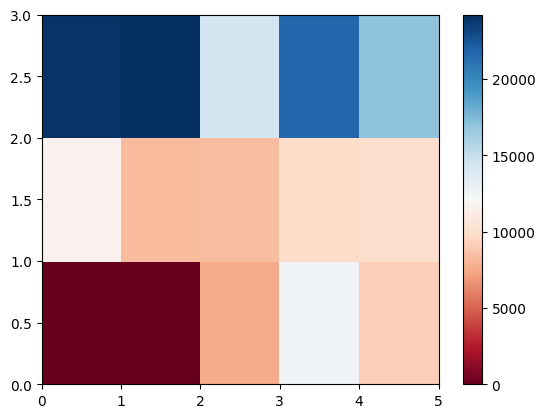

In [ ]:
# Importar libreria de visualización
import matplotlib.pyplot as plt

# Utilizar los resultados agrupados
plt.pcolor(grupo2_pivot, cmap='RdBu')
plt.colorbar()
plt.show()

El mapa de calor traza la variable objetivo **price** proporcional al color con respecto a las variables **drive-wheel** y **body-style** en los ejes vertical y horizontal, respectivamente. Esto permite visualizar cómo se relaciona el precio con **drive-wheel** y **body-style**.

Las etiquetas predeterminadas no nos transmiten información útil. En el siguiente código se puede mejorar ese aspecto:

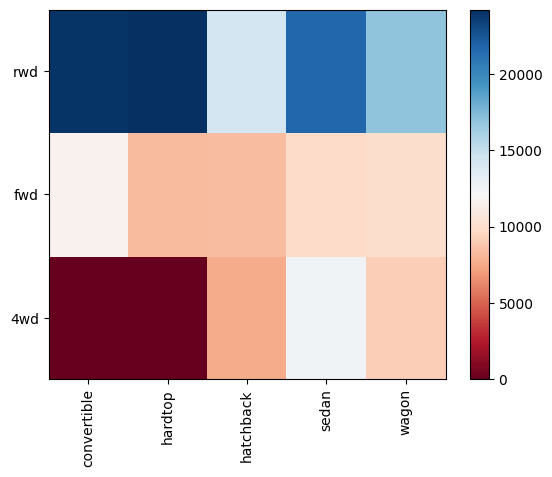

In [ ]:
fig, ax = plt.subplots()
im = ax.pcolor(grupo2_pivot, cmap='RdBu')

# nombres de las etiquetas
row_labels=grupo2_pivot.columns.levels[1]
col_labels=grupo2_pivot.index

# Mover etiquetas al centro
ax.set_xticks(np.arange(grupo2_pivot.shape[1]) + 0.5, minor=False)
ax.set_yticks(np.arange(grupo2_pivot.shape[0]) + 0.5, minor=False)

# Insertar etiquetas
ax.set_xticklabels(row_labels, minor=False)
ax.set_yticklabels(col_labels, minor=False)

# Rotar las etiquetas si son muy largas
plt.xticks(rotation=90)

fig.colorbar(im)
plt.show()

AHORA TÚ

Utiliza la función "groupby" para encontrar el "precio" promedio de cada coche basado en "body-style"

In [ ]:
# Solución

# Agrupando los datos por 'body-style' y calculando el precio promedio
df_body_style_price = df.groupby('carroceria-estilo', as_index=False)['precio'].mean()

# Mostrando el resultado
df_body_style_price


,carroceria-estilo,precio
0,convertible,21890.500000
1,hardtop,22208.500000
2,hatchback,9957.441176
3,sedan,14459.755319
4,wagon,12371.960000
